In [11]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pathresults = "../../scripts/results/"
#pathresults = "/DUMUXDune27/DUMUX/dumux-rosi/python/paperSc/results/"
data_file_delimiter = ","
import re

evalTime = 25.

#path2file_ = r'newMucil/{}_1476_{}_10to11_20mn_0s_10/'

#path2file_ = r'CSTiminSame_exud4p/{}_1476_{}_10to25_20mn_0s_128/'


In [12]:
def getVal(mypath, filename,dtype=float,extension='.txt', header="infer",names = None):
    fullpath = pathresults +mypath+filename
    data_file_delimiter = ","
    if names is None:
        largest_column_count = 0
        with open(fullpath, 'r') as temp_f:
            lines = temp_f.readlines()
        last_line = lines[-1].strip()
        #print('last_line',last_line)
        array_from_last_line = np.array(last_line.split(','), dtype=dtype)
        largest_column_count = len(array_from_last_line)
        names = [i for i in range(0, largest_column_count)]
        cst = pd.read_csv(fullpath,delimiter=data_file_delimiter, 
                          header = header, names = names,dtype=dtype)
        #print('cst',cst.shape)
    else:
        cst = pd.read_csv(fullpath,delimiter=data_file_delimiter, header = header, names = names)
    return cst
    
def get_last_line_as_numpy_array(file_path,  dtype = float, verbose = False):
    with open(pathresults +file_path, 'r') as file:
        # Read all lines
        lines = file.readlines()

        # Check if there are any lines in the file
        if not lines:
            raise ValueError("The file is empty")

        # Get the last line
        
        try:
            last_line = lines[-1].strip()
        except:
            print('timeLine',file_path, len(lines))
            raise Exception

        # Split the last line by commas and convert to NumPy array
        array_from_last_line = np.array(last_line.split(','), dtype=dtype)
        if verbose:
            print(file_path, len(array_from_last_line), end=", ")

        return array_from_last_line

def getCylIdx(path2file):
    fileName = "rhizoSegsId.txt"
    fullpath = path2file+fileName
    rhizoSegsId = get_last_line_as_numpy_array(fullpath, dtype = int, verbose = True)
    print('rhizoSegsId',max(rhizoSegsId))
    return rhizoSegsId
    
def list_files_with_prefix(folder_path, prefix):
    file_names = []
    for file_name in os.listdir(pathresults+folder_path):
        if file_name.startswith(prefix):
            file_names.append(file_name)
    return file_names

# cylinder max konz (per cell)
def getData_(cid,gId,path2file):
    fileName = "cyl_val/Cyl_cellVol_"+str(gId)+".txt"
    cVol = get_last_line_as_numpy_array(path2file+fileName, dtype = float)
    if cid == volIdx:
        return sum(cVol)
    elif cid <= 9:
        if cid <= 2:# == 0:
            fileName = "cyl_val/Cyl_watercontent_"+str(gId)+".txt"
            theta = get_last_line_as_numpy_array(path2file+fileName,dtype = float)
            cVol *= theta#cm3 scv to cm3 water
            if cid == 0:
                return sum(cVol)
        fileName = "cyl_val/Cyl_content"+str(cid)+"_"+str(gId)+".txt"
        Q1 = get_last_line_as_numpy_array(path2file+fileName,  dtype = float)
        konz = sum(Q1)/sum(cVol) #mol/cm3 or cm3/cm3
        return konz
    raise Exception

plantData = ['Q_Ag','Q_Rm','Q_Gr', 'Q_Exud_tot', 'Q_Mucil_tot',
             'Q_Exud','Q_Mucil','Q_S_ST','Q_S_meso',
             'trans' ,'psiXyl','nodes_Z','segments_nodeX',
             'time','pSet','scenario' ]

#extensions = {0:'.txt',1:'.txt',2:'.txt',3: '.txt', 4:'.txt',
#             5:'.txt',
#             6:'.txt', 7:'.txt',8:'.txt', 9:'.txt', 10:'.txt',
#              11:'.txt',12:'.txt',13:'.txt'}
colNames=np.array(list(plantData))
nToGet = len(plantData)-3 # all except pset and scenario

scenarios = [ "baseline", "lateDry","earlyDry"]
setIds =[5,44,61]# ,44,49 [7,21, 47, 85]
exceptPset = []#[('baseline','19'),('baseline','47'),('baseline','83')]
# result_list_compExcept = [path2file.format(scenario, str(setId)) for scenario, setId in exceptPsets]
dataInput =  [(scenario, str(setId)) for scenario in scenarios 
              for setId in setIds if (scenario, str(setId)) 
              not in exceptPset ]
# result_list_comp = [path2file.format(dI[0], dI[1]) 
#                    for dI in dataInput]

# numPset = len(dataInput)


def getData():
    
    GiniAll = [[] for i in range(len(dataInput))]
    
    for idSet, dI in enumerate(dataInput):
        GiniAll_ = pd.DataFrame(columns=colNames)
        print(idSet,end =", ")

        path2file = path2file_.format(dI[0], dI[1])
        #print(path2file)

        time = np.array(list(
            pd.read_csv(pathresults + path2file + "time.txt", 
                           names = ["time","Qlight"])["time"][1:])) # because we have twice the initial value
        timemax = int((max(time))*10)/10
        print('timemax',max(time),timemax, len(time))
        
        if(True):#timemax==25):


            for cid in range(nToGet):
                if (plantData[cid] == 'psiXyl'):
                    Ginits = getVal(path2file,plantData[cid]+'.txt'#extensions[cid]
                            ).mean(axis=1)
                else:
                    Ginits = getVal(path2file,plantData[cid]+'.txt'#extensions[cid]
                            ).sum(axis=1)
                #print(plantData[cid])#,Ginits,type(Ginits))
                GiniAll_[plantData[cid]]= Ginits
            Q_Exud_mean = getVal(path2file,"Q_Exud.txt").diff(axis=0)
            #Q_Exud_mean = Q_Exud_mean.drop(Q_Exud_mean.columns[0], axis=1) # drop seed node
            Q_Exud_mean.drop(Q_Exud_mean.columns[0], axis=1,inplace=True) # drop seed node
            Q_Exud_mean.columns = [i for i in range(len(Q_Exud_mean.columns))] # reset to have column name == index
            #isRootTip = getVal(path2file,"isRootTip.txt", dtype=str)
            #isRootTip = isRootTip.fillna('False')
            #isRootTip = isRootTip=='True'
            
            GiniAll_['Q_Exud_min'] = Q_Exud_mean.min(axis=1)
            GiniAll_['Q_Exud_max'] = Q_Exud_mean.max(axis=1)
            #GiniAll_['Q_Exud_mean'] = Q_Exud_mean[isRootTip.to_numpy()].mean(axis=1)
            GiniAll_[plantData[nToGet]]= time[:len(GiniAll_[plantData[nToGet]])]
            GiniAll_[plantData[nToGet+1]]= dI[1]
            GiniAll_[plantData[nToGet+2]]= dI[0]
            
        GiniAll[idSet] = GiniAll_
    return GiniAll #cid pSet rr
    


In [13]:
#path2file_ = r'getsrivssriset/{}_1476_{}_10to25_20mn_0s_64/'
#path2file_ = r'testspeed/thr4{}_1476_{}_10to25_20mn_0s_32/'
#path2file_ = r'checkCbalance/{}_1476_{}_10to25_20mn_0s_32/'
#path2file_ = r'checkCbalanceWrsi1perr/{}_1476_{}_10to25_20mn_0s_32/'
path2file_ = r'TraiRhizo/paperSc/NewSetup/{}_1440_{}_10to25_20mn_0s_32/'
setIds =[5,44,61]
dataInput =  [(scenario, str(setId)) for scenario in scenarios 
              for setId in setIds if (scenario, str(setId)) 
              not in exceptPset ]
GiniAll = getData()
dftemp=[]
for Gini in GiniAll:
    dftemptemp=pd.DataFrame(Gini)
    dftemp.append(dftemptemp)

0, timemax 25.000000000000423 25.0 1080
1, timemax 25.000000000000423 25.0 1080
2, timemax 25.000000000000423 25.0 1080
3, timemax 25.000000000000423 25.0 1080
4, timemax 25.000000000000423 25.0 1080
5, timemax 25.000000000000423 25.0 1080
6, timemax 25.000000000000423 25.0 1080
7, timemax 25.000000000000423 25.0 1080
8, timemax 25.000000000000423 25.0 1080


TraiRhizo/paperSc/NewSetup/baseline_1440_5_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/baseline_1440_44_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/baseline_1440_61_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/lateDry_1440_5_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/lateDry_1440_44_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/lateDry_1440_61_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/earlyDry_1440_5_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/earlyDry_1440_44_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/earlyDry_1440_61_10to25_20mn_0s_32/


In [34]:
print(nodes_Z[segments_nodeX],
nodes_Z[segments_nodeY])

[-0.3        -1.24769599 -2.18456723 ... -3.9600246  -3.17194551
 -3.20407199] [-1.24769599 -2.18456723 -3.03202245 ... -4.90367472 -3.70957998
 -3.97987947]


In [30]:
print('segments_nodeX',segments_nodeX)
print('segments_nodeY',segments_nodeY)

segments_nodeX [  0.   1.   2. ... 315. 293. 294.]
segments_nodeY [   1    2    3 ... 1209 1210 1211]


In [9]:
exuds = []
mucils = []
for ddd in dataInput:
    pp = path2file_.format(ddd[0],ddd[1])
    fileName = "Q_Exud_tot.txt"
    print(ddd[0]+ddd[1],"=",get_last_line_as_numpy_array(pp+fileName)[0])
    exuds.append(get_last_line_as_numpy_array(pp+fileName)[0])
print()
for ddd in dataInput:
    pp = path2file_.format(ddd[0],ddd[1])
    fileName = "Q_Mucil_tot.txt"
    print(ddd[0]+ddd[1],"=",get_last_line_as_numpy_array(pp+fileName)[0])
    mucils.append(get_last_line_as_numpy_array(pp+fileName)[0])

baseline5 = 0.012426412309727838
baseline44 = 0.012426412309727838
baseline61 = 0.012426412309727838
lateDry5 = 0.015565128904694308
lateDry44 = 0.015559019950005974
lateDry61 = 0.015346951229574374
earlyDry5 = 0.007887189871570721
earlyDry44 = 0.0077299212253993605
earlyDry61 = 0.007490981638840403

baseline5 = 0.0001511440053412998
baseline44 = 0.0001511440053412998
baseline61 = 0.0001511440053412998
lateDry5 = 0.00035233849035853665
lateDry44 = 0.0003531040356813521
lateDry61 = 0.00037604685157435216
earlyDry5 = 0.0001256048843069256
earlyDry44 = 0.0001383575556494543
earlyDry61 = 0.0001500763737780191


In [10]:
exuds = np.array(exuds)
mucils = np.array(mucils)
print('exud')
print((-1+exuds[3:6]/exuds[:3])*100,
(-1+exuds[6:]/exuds[:3])*100)
print('mucil')
print((-1+mucils[3:6]/mucils[:3])*100,
(-1+mucils[6:]/mucils[:3])*100)

exud
[25.25842952 25.20926847 23.50267195] [-36.52882526 -37.79442503 -39.71726149]
mucil
[133.11443253 133.62093315 148.80037467] [-16.89721069  -8.45977957  -0.70636712]


In [11]:
if False:
    for ddd in dataInput:
        pp = path2file_.format(ddd[0],ddd[1])
        fileName = "Q_Mucil_tot.txt"
        qmuciltot = get_last_line_as_numpy_array(pp+fileName)[0]
        fileName = "Q_Exud_tot.txt"
        qexudtot = get_last_line_as_numpy_array(pp+fileName)[0]
        print(ddd[0]+ddd[1],"=",qmuciltot/qexudtot*100.) # [1-10]%
    print()#Q_Ag
    for ddd in dataInput:
        pp = path2file_.format(ddd[0],ddd[1])
        fileName = "Q_Ag.txt"

        qagtot = get_last_line_as_numpy_array(pp+fileName)[0]
        fileName = "Q_Exud_tot.txt"
        qexudtot = get_last_line_as_numpy_array(pp+fileName)[0]
        print(ddd[0]+ddd[1],"=",qexudtot/qagtot*100.) # [3-40]%
    print()#Q_Ag
allresp = []
for ddd in dataInput:
    pp = path2file_.format(ddd[0],ddd[1])
    fileName = "Q_Rm.txt"    
    qrmtot = sum(get_last_line_as_numpy_array(pp+fileName))#[0]
    fileName = "Q_Gr.txt"    
    qrgrtot = sum(get_last_line_as_numpy_array(pp+fileName))#[0]
    print(ddd[0]+ddd[1],"=",qrmtot+qrgrtot*0.2) # [3-40]%
    allresp.append(qrmtot+qrgrtot*0.2)

baseline5 = 0.022989764217984848
baseline44 = 0.022989764217984848
baseline61 = 0.022989764217984848
lateDry5 = 0.018853529549665207
lateDry44 = 0.01885606750789881
lateDry61 = 0.018946892880571276
earlyDry5 = 0.016324848107085406
earlyDry44 = 0.016576622496568504
earlyDry61 = 0.016621232013663736


In [7]:
# get max exudation rate
setIds =[5,44,61]
dataInput =  [(scenario, str(setId)) for scenario in scenarios 
              for setId in setIds if (scenario, str(setId)) 
              not in exceptPset ]
path2file_ =  r'TraiRhizo/paperSc/NewSetup/{}_1440_{}_10to25_20mn_0s_32/' #r'TraiRhizo/paperSc/NewSetup/1cm0{}_1440_{}_10to25_20mn_0s_32/'
for ddd in dataInput:
    pp = path2file_.format(ddd[0],ddd[1])
    time = np.array(list(
            pd.read_csv(pathresults + pp + "time.txt", 
                           names = ["time","Qlight"])["time"][1:])) # because we have twice the initial value
    Q_Exud_diff = getVal(pp,"Q_Exud.txt").diff(axis=0)# mol C per 20mn
    Q_Exud_diff.drop(Q_Exud_diff.columns[0], axis=1,inplace=True) # drop seed node
    Q_Exud_diff.columns = [i for i in range(len(Q_Exud_diff.columns))]
    subTypes = getVal(pp,"subTypes.txt")
    organTypes = getVal(pp,"organTypes.txt")
    subTypes = subTypes.fillna(-1)
    subTypes = subTypes.astype(int)
    organTypes = organTypes.fillna(-1)
    organTypes = organTypes.astype(int)
    length_Segs = getVal(pp,"length_Segs.txt")
    radius_ = [0.05,0.02,0.02,0.05]
    radius = subTypes.copy() #radius_[subTypes]
    for ii in range(len(radius_)):
        radius[subTypes.to_numpy()==ii] = radius_[ii]
    sideSurface = 2 * np.pi * radius * length_Segs # cm2
    #Q_Exud_rate = Q_Exud_diff/sideSurface / (20*60) * 1000 # [mol C/20mn] * [20mn/s] / cm2 => mmol C/cm2/s
    Q_Exud_rate = Q_Exud_diff/sideSurface * 3*24 * 1000 # [mol C/20mn] / cm2 * [20mn/d] * [mmol/mol]=> mmol C/cm2/d
    Q_Exud_diff_issue = Q_Exud_diff.copy()
    Q_Exud_diff_issue[organTypes.to_numpy()==2]=0
    Q_Exud_rate_np = Q_Exud_rate.to_numpy()
    pointloc=Q_Exud_rate[Q_Exud_rate==Q_Exud_rate.max().max()].stack().index.tolist()[0]
    print(ddd,pointloc,'time',time[pointloc[0]],'exud',Q_Exud_rate.max().max(),Q_Exud_rate.values[pointloc[0],pointloc[1]],#mmol C/cm2/s
          Q_Exud_diff_issue.max().max(),
         'length_Segs',length_Segs.values[pointloc[0],pointloc[1]], 'sideSurface',sideSurface.values[pointloc[0],pointloc[1]],
         radius.to_numpy()[pointloc[0],pointloc[1]],length_Segs.to_numpy()[pointloc[0],pointloc[1]],organTypes.values[pointloc[0],pointloc[1]])

('baseline', '5') (86, 130) time 11.208333333333368 exud 0.15356939442242942 0.15356939442242942 0.0 length_Segs 1.0 sideSurface 0.12566370614359174 0.02 1.0 2
('baseline', '44') (86, 130) time 11.208333333333368 exud 0.15356939442242942 0.15356939442242942 0.0 length_Segs 1.0 sideSurface 0.12566370614359174 0.02 1.0 2
('baseline', '61') (86, 130) time 11.208333333333368 exud 0.15356939442242942 0.15356939442242942 0.0 length_Segs 1.0 sideSurface 0.12566370614359174 0.02 1.0 2
('lateDry', '5') (86, 130) time 11.208333333333368 exud 0.15356939442242942 0.15356939442242942 0.0 length_Segs 1.0 sideSurface 0.12566370614359174 0.02 1.0 2
('lateDry', '44') (86, 130) time 11.208333333333368 exud 0.15356939442242942 0.15356939442242942 0.0 length_Segs 1.0 sideSurface 0.12566370614359174 0.02 1.0 2
('lateDry', '61') (86, 130) time 11.208333333333368 exud 0.15356939442242942 0.15356939442242942 0.0 length_Segs 1.0 sideSurface 0.12566370614359174 0.02 1.0 2
('earlyDry', '5') (63, 130) time 10.888

In [153]:
pointloc#[0]

MultiIndex([(86, 122)],
           )

In [146]:
organTypes.loc[1079,1087]

3

In [9]:
0.333*24

7.992000000000001

In [133]:
Q_Exud_rate.loc[pointloc[0]]

7.337558114949737e-06

In [139]:
pointloc

[(1079, 1087)]

In [136]:
Q_Exud_rate[organTypes.to_numpy()==3].max().max()

7.337558114949737e-06

In [122]:
Q_Exud_rate.values

array([[False, False, False, ..., False, False, False],
       [False,  True,  True, ..., False, False, False],
       [False,  True,  True, ..., False, False, False],
       ...,
       [False,  True,  True, ..., False, False, False],
       [False,  True,  True, ...,  True, False, False],
       [False,  True,  True, ...,  True,  True, False]])

In [117]:
getVal(pp,"length_Segs.txt")

,0,1,2,3,4,5,6,7,8,9,...,506,507,508,509,510,511,512,513,514,515
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.065891,1.006315,1.006102,0.1,1.0,NaN,NaN
1076,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.072504,1.006696,1.006483,0.1,1.0,NaN,NaN
1077,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.078460,1.007010,1.006797,0.1,1.0,NaN,NaN
1078,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.083990,1.007281,1.007068,0.1,1.0,1.0,NaN


In [115]:
print(sideSurface.to_numpy()[pointloc[0],pointloc[1]][0])

0.034016940719266184


In [100]:
pointloc

(array([1079]), array([1087]))

In [95]:
Q_Exud_rate.max().max()

6.8907172048284856e-06

In [91]:
Q_Exud_diff_issue = Q_Exud_diff.copy()
Q_Exud_diff_issue[organTypes.to_numpy()==2]=0

In [84]:
Q_Exud_diff_issue[organTypes.to_numpy()==2]

,1,2,3,4,5,6,7,8,9,10,...,409,410,411,412,413,414,415,416,417,418
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1076,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1077,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1078,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [88]:
Q_Exud_diff_issue.loc[1][143]

4.683534413144786e-07

In [90]:
organTypes.loc[1][143]

3

In [97]:
Q_Exud_diff_issue.max().max()

0.0

In [71]:
Q_Exud_diff_issue.max(axis=1)

0       0.000000e+00
1       4.683534e-07
2       5.444253e-07
3       5.747252e-07
4       5.906573e-07
            ...     
1075    1.210754e-07
1076    1.190450e-07
1077    1.173757e-07
1078    1.156833e-07
1079    1.707216e-07
Length: 1080, dtype: float64

In [49]:
Q_Exud_diff.shape

(1080, 418)

In [50]:
organTypes.shape

(1080, 418)

In [45]:
Q_Exud_rate[1]

0       NaN
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1075    0.0
1076    0.0
1077    0.0
1078    0.0
1079    0.0
Name: 1, Length: 1080, dtype: float64

In [48]:
np.nanmax(Q_Exud_rate[organTypes==3])

6.8907172048284856e-06

In [48]:
allresp = np.array(allresp)
print((-1+allresp[3:6]/allresp[:3])*100)
print((-1+allresp[6:]/allresp[:3])*100)

[-18.91438905 -18.89844014 -18.07211937]
[-29.23067572 -29.24033666 -27.84175918]


baseline 5
baseline 44
baseline 61
lateDry 5
lateDry 44
lateDry 61
earlyDry 5
earlyDry 44
earlyDry 61


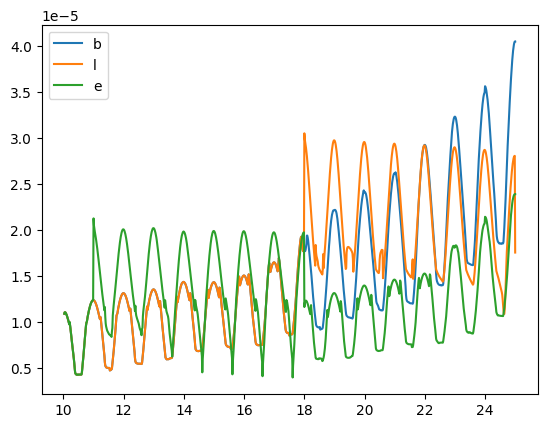

In [28]:

for dd in dftemp:
    print(dd['scenario'][0], dd['pSet'][0])

# pset 5:
ddb = dftemp[0]; ddl = dftemp[3]; dde = dftemp[6]
plt.plot(ddb['time'][1:], np.diff(ddb['Q_Rm']), label='b')
plt.plot(ddl['time'][1:], np.diff(ddl['Q_Rm']), label='l')
plt.plot(dde['time'][1:], np.diff(dde['Q_Rm']), label='e')
plt.legend()
#plt.plot(ddb['time'], ddb['Q_Rm'])

In [26]:
import string
from matplotlib import colors
from matplotlib.lines import Line2D
from matplotlib.ticker import ScalarFormatter
from matplotlib.transforms import ScaledTranslation
l_styles = {5:'-',44:'--',61:':'}
# Define the color dictionary
c_styles = {
    'baseline':'#8da0cb',  # Blue
    'earlyDry':  '#66c2a5' ,  # Green
    'lateDry': '#fc8d62'  # red
}


color_legend_elements = [
    Line2D([0], [0], color=c_styles['baseline'], lw=6, label='baseline'),
    Line2D([0], [0], color=c_styles['earlyDry'], lw=6, label='earlyDry'),
    Line2D([0], [0], color=c_styles['lateDry'], lw=6, label='lateDry')
]

# Line style legend
linestyle_legend_elements = [
    Line2D([0], [0], color='black', linestyle=l_styles[5], lw=6, label="highCO2"),
    #Line2D([0], [0], color='black', linestyle=l_styles[38], lw=6, label=38),
    Line2D([0], [0], color='black', linestyle=l_styles[44], lw=6, label="highMB"),
    Line2D([0], [0], color='black', linestyle=l_styles[61], lw=6, label="highSolutes")
]

def dotheplot(toplot, cumsum,df, sizerows,sizecols_,namesyaxes=None,ncols=3, maxTime = None, 
              indexlegend1=0, indexlegend2=1, microbes = [5,44,61]):
    nrows = len(toplot)
    #ncols = 3
    scenarios = [ "baseline","earlyDry", "lateDry"]
    sizecols = sizecols_*ncols

    cm3tommol = 1000*(1/18.01528)

    # higher than in the 1st paper
    # probably in part because i increased the kr of the roots
    cm3tommol = 1000*(1/18.01528)
    ratioTrans = 250 
    
    fig, ax = plt.subplots(nrows, ncols,figsize=(sizerows,sizecols))  # 2 rows, 2 columns
    if len(microbes) < 3:
        df = [dftemp for dftemp in df if int(dftemp['pSet'].unique()[0]) in microbes]
        
    for ddid, dd in enumerate(df):
        for rowid, tipi in enumerate(toplot): 
            try:
                pset_ = int(dd['pSet'].unique()[0])
            except:
                print('rowid', rowid,tipi)
                print(dd['pSet'].unique())
            scenario_ = dd['scenario'].unique()[0]
            if ncols > 1:
                colid = np.where(scenario_==np.array(scenarios))[0][0]
            else:
                colid = 0
            factor = 1000
            rot = 0
            unit=" (mmol C)"
            if (tipi == "trans" )or (tipi =='psiXyl'):
                factor = cm3tommol
                unit = " (cm3)"
                
            if tipi == "psiXyl":
                factor = 1.
                rot =30
                unit = " (cm)"
            ddd = dd[tipi]*factor
            tts = dd['time']
            if not cumsum:
                tts = dd['time'][1:]
                ddd = np.diff(ddd)*4
            
            if ncols > 1:
                ax_ = ax[rowid, colid]
            else:
                ax_ = ax[rowid]
                
            if len(microbes) == 3:
                lttemp = l_styles[int(dd['pSet'].unique()[0])]
            else:
                lttemp = '-'
                
            ax_.plot( tts,ddd,
                                                             linewidth=3,
                         #label=f'{i}',
                         c=c_styles[dd['scenario'].unique()[0]],
                         linestyle=lttemp
                    )
            
                
            ax_.tick_params(axis='both', which='major', labelsize=18)
            ax_.tick_params(axis='y', which='major', labelrotation=rot, labelsize=18)
            if colid == 0:
                if namesyaxes is not None:
                    if tipi == "psiXyl":
                        ax_.set_ylabel(namesyaxes[tipi]+unit, fontsize=20)
                    else:
                        ax_.set_ylabel("cumulative C (mmol C)\nused for"+namesyaxes[tipi], fontsize=20)
                else:
                    ax_.set_ylabel(tipi+unit, fontsize=20)
            if rowid == 0 and ncols > 1:
                ax_.set_title(scenario_)
            if rowid == nrows-1:
                ax_.set_xlabel('time (d)', fontsize=20)
            else:
                ax_.set_xticklabels([])
                
            if True:
                if scenario_ == "lateDry":
                    ax_.axvline(x=18, color='k', linestyle='--')
                    ax_.axvline(x=25, color='k', linestyle='--')
                if scenario_ == "earlyDry":
                    ax_.axvline(x=18, color='k', linestyle='--')
                    ax_.axvline(x=11, color='k', linestyle='--')
            if maxTime is not None:
                ax_.set_xlim(10, maxTime)
                
            if rowid + colid == indexlegend1:
                ax_.legend(handles=color_legend_elements, 
                                                           fontsize=20,title_fontsize='25', title='scenario', 
                                                           loc='upper center',  ncol=3)#bbox_to_anchor=(0.5, -0.15),
                
            if (rowid + colid == indexlegend2) and (len(microbes) == 3):
                ax_.legend(handles=linestyle_legend_elements, 
                                                           fontsize=20,title_fontsize='25', title='parameter set', 
                                                           loc='upper center',  ncol=3)#bbox_to_anchor=(0.5, -0.3),
                if False:
                    
                    ax_.add_artist(plt.legend(handles=color_legend_elements, 
                                                                              fontsize=20, title='scenario', 
                                                                               title_fontsize='25',
                                                                              loc='upper center',# bbox_to_anchor=anchor1,#(0.5, -0.15), 
                                                                              ncol=3, framealpha=1))
                    ax_.add_artist(plt.legend(handles=linestyle_legend_elements, 
                                                                              fontsize=20, title='parameter set', 
                                                                               title_fontsize='25',
                                                                              loc='upper center',# bbox_to_anchor=anchor2,#(0.5, -0.3), 
                                                                              ncol=3, framealpha=1))

                #ax_.legend() 
            index = rowid * ncols + colid
            # Get the corresponding letter label
            label = '('+string.ascii_lowercase[index]+')'
            ax_.annotate(
                    label,
                    xy=(0, 1.15), xycoords='axes fraction',
                    xytext=(+0.5, -0.5), textcoords='offset fontsize',
                    fontsize='20', verticalalignment='top', fontfamily='serif',
                    bbox=dict(facecolor='1.', edgecolor='none', pad=3.0))
    plt.tight_layout()

In [23]:
for dd in dftemp:#[0]#['Q_Gr']
    #dftemp['Resp']=dftemp['Q_Gr']*0.2+ dftemp["Q_Rm"]
    dd['Resp']=dd['Q_Gr']*0.2+ dd["Q_Rm"]

In [170]:
[int(dd['pSet'].unique()[0]) for dd in dftemp if int(dd['pSet'].unique()[0]) in [44] ]

[44, 44, 44]

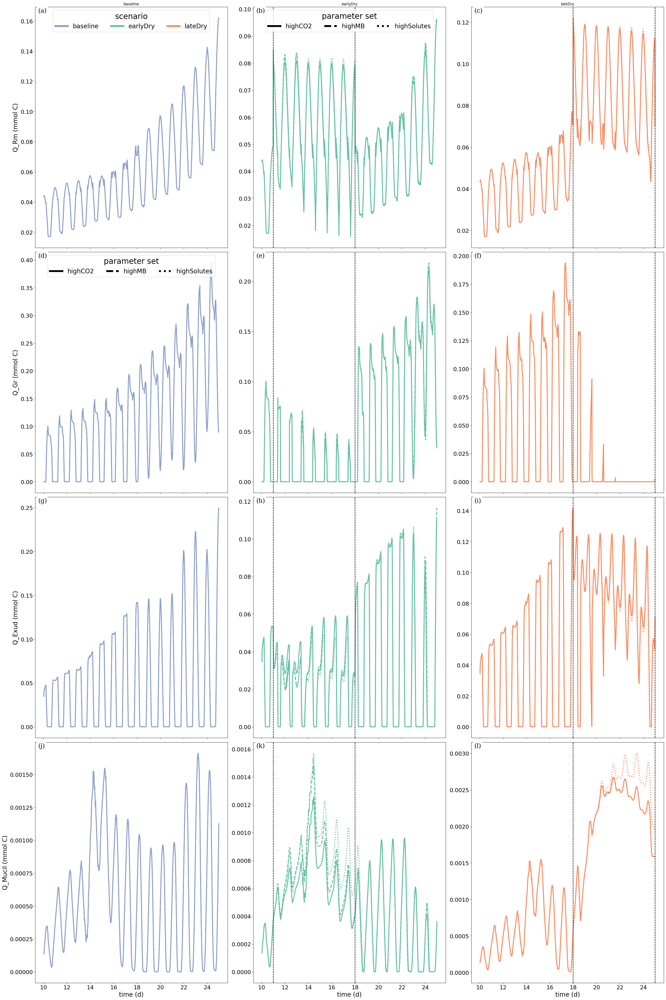

In [21]:

dotheplot(toplot =  ['Q_Rm','Q_Gr','Q_Exud', 'Q_Mucil'],
          cumsum=False, df=dftemp, sizerows=30,sizecols_=15)

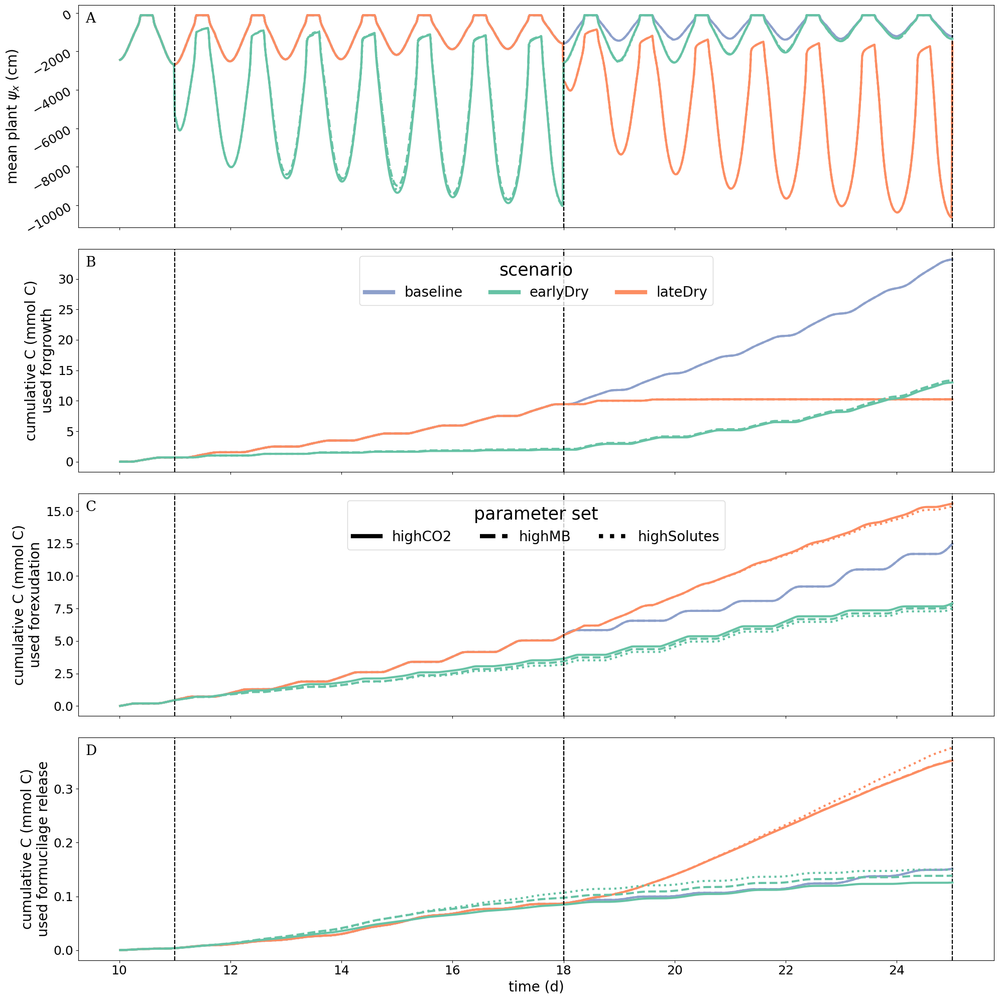

In [15]:
dotheplot(toplot =  ['psiXyl','Q_Gr','Q_Exud','Q_Mucil'],#'Q_Exud_mean',
          namesyaxes={'psiXyl':"mean plant $\psi_x$", 'Resp':'Resp',
                      'Q_Gr':"growth", "Q_Rm":"maintenance","Q_Ag":"Q_Ag",
                      'Q_Exud':"exudation",'Q_Exud_mean':"exudation rate\n at root tip",
                      'Q_Mucil': "mucilage release"},
          cumsum=True, df=dftemp, sizerows=20,sizecols_=20,ncols=1, 
          indexlegend1=1, indexlegend2=2)
plt.savefig('Cusageold.png')

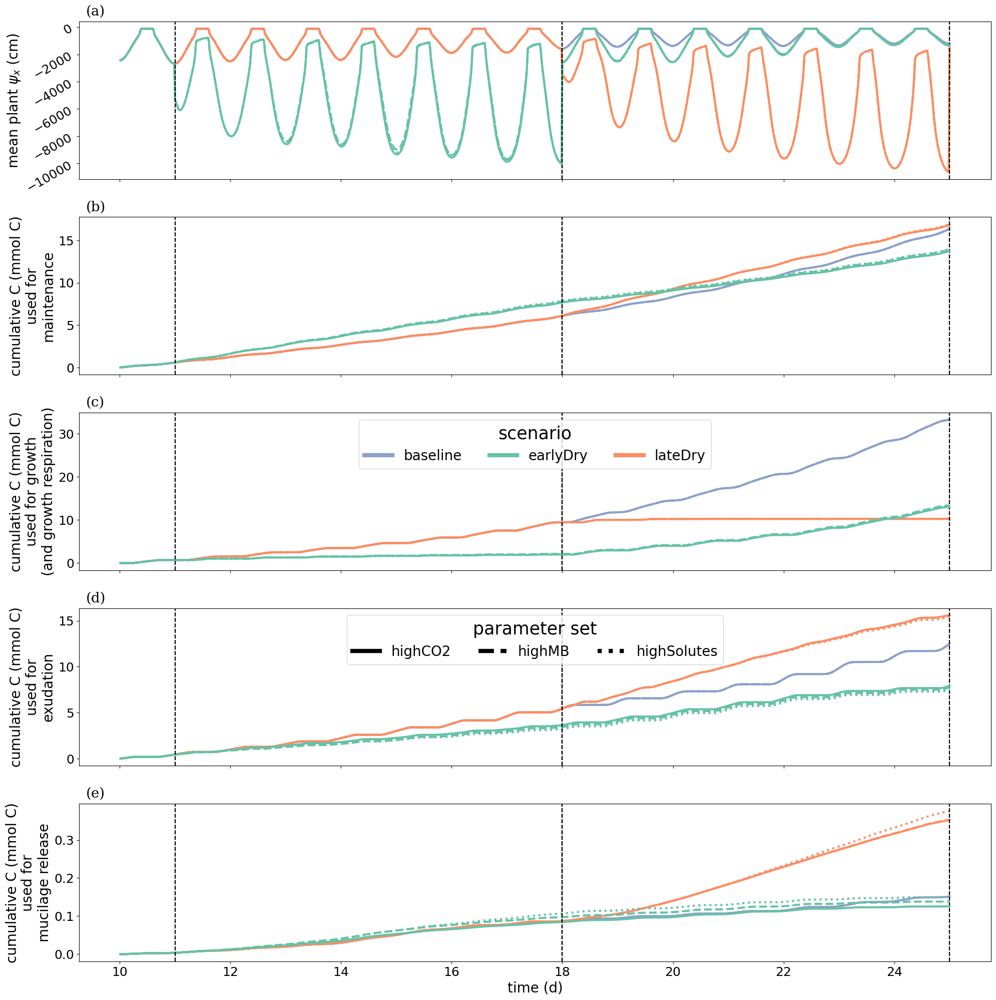

In [27]:
dotheplot(toplot =  ['psiXyl','Q_Rm','Q_Gr','Q_Exud','Q_Mucil'],#'Q_Exud_mean',
          namesyaxes={'psiXyl':"mean plant $\psi_x$", 'Resp':'Resp',
                      'Q_Gr':" growth\n(and growth respiration)", "Q_Rm":"\nmaintenance","Q_Ag":"Q_Ag",
                      'Q_Exud':"\nexudation",'Q_Exud_mean':"exudation rate\n at root tip",
                      'Q_Mucil': "\nmucilage release"},
          cumsum=True, df=dftemp, sizerows=20,sizecols_=20,ncols=1, 
          indexlegend1=2, indexlegend2=3)
plt.savefig('Cusage.png')

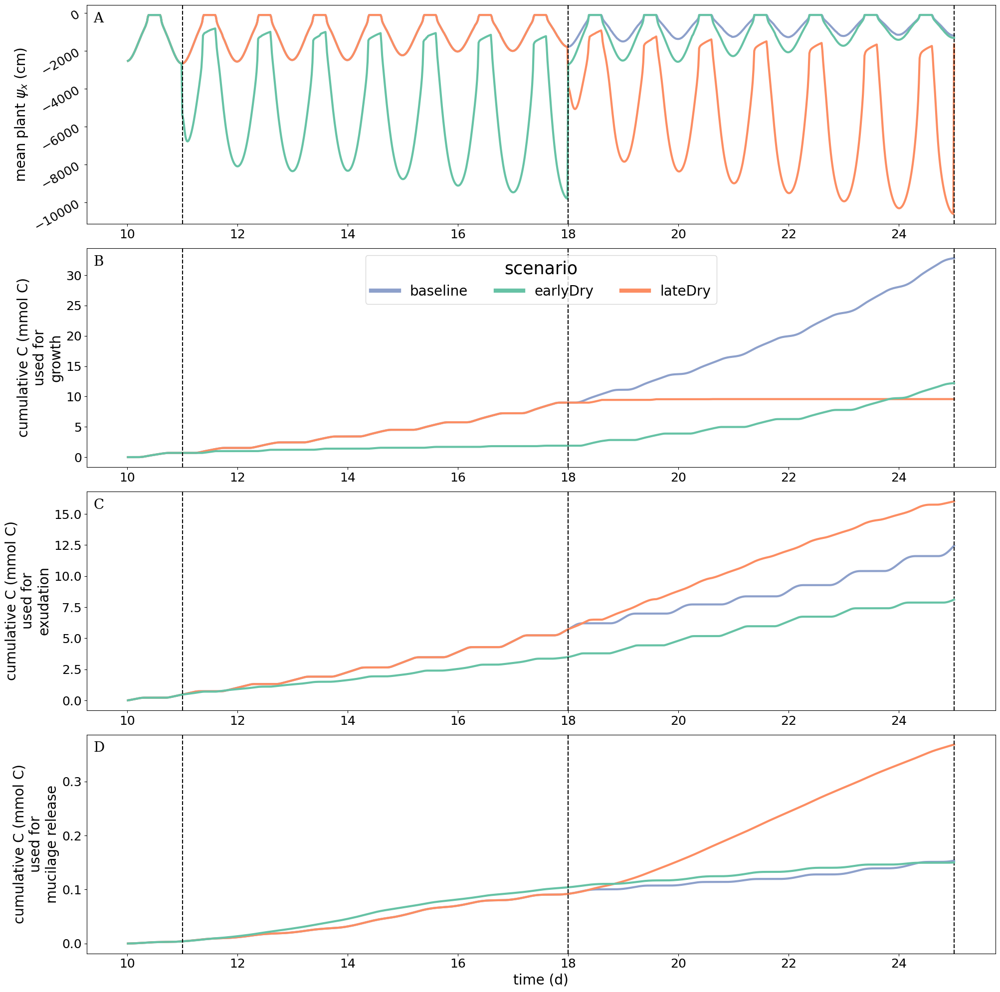

In [172]:
dotheplot(toplot =  ['psiXyl','Q_Gr','Q_Exud','Q_Mucil'],#'Q_Exud_mean',
          namesyaxes={'psiXyl':"mean plant $\psi_x$", 'Resp':'Resp',
                      'Q_Gr':"growth", "Q_Rm":"maintenance","Q_Ag":"Q_Ag",
                      'Q_Exud':"exudation",'Q_Exud_mean':"exudation rate\n at root tip",
                      'Q_Mucil': "mucilage release"},microbes = [44],
          cumsum=True, df=dftemp, sizerows=20,sizecols_=20,ncols=1, 
          indexlegend1=1, indexlegend2=2)
plt.savefig('Cusage_topic7.png')

In [32]:
import pickle
with open("4Andrea.pkl", "wb") as file:
    pickle.dump(dftemp, file)

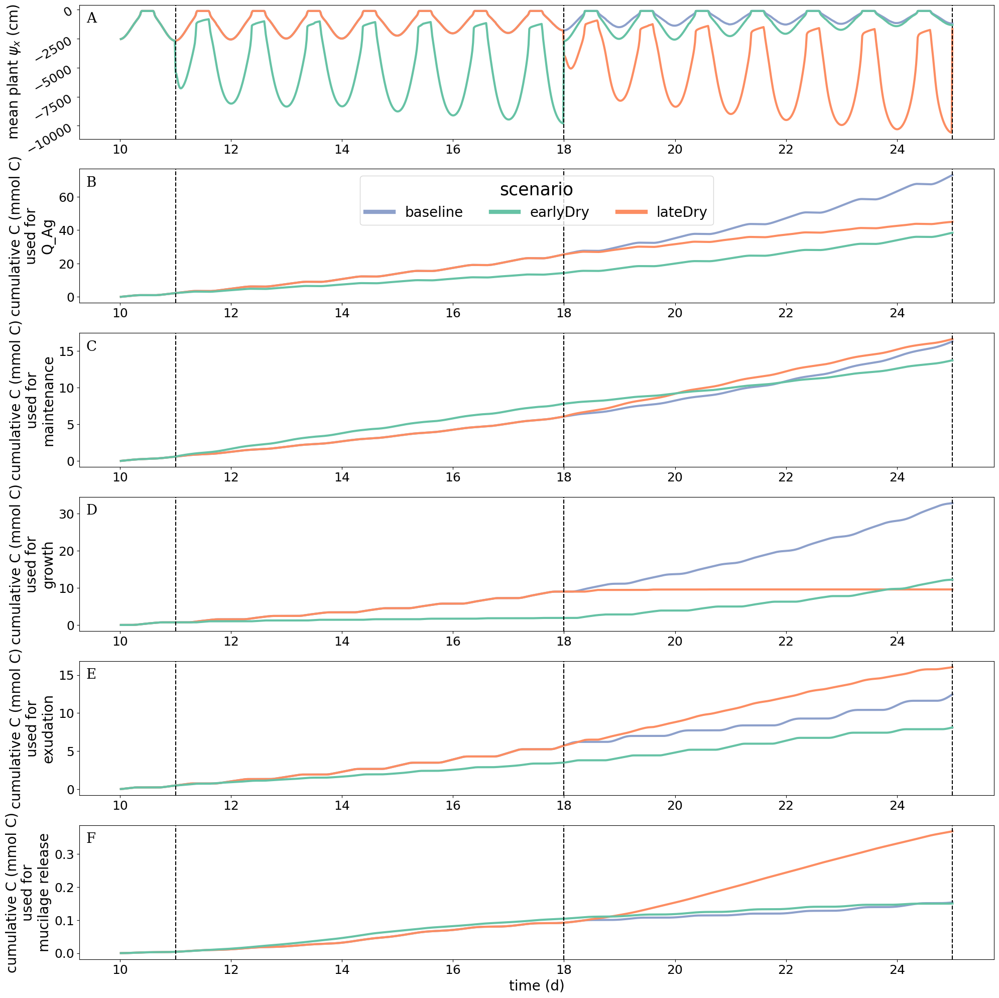

In [173]:
dotheplot(toplot =  ['psiXyl',"Q_Ag","Q_Rm",'Q_Gr','Q_Exud','Q_Mucil'],#'Q_Exud_mean',
          namesyaxes={'psiXyl':"mean plant $\psi_x$", 'Resp':'Resp',
                      'Q_Gr':"growth", "Q_Rm":"maintenance","Q_Ag":"Q_Ag",
                      'Q_Exud':"exudation",'Q_Exud_mean':"exudation rate\n at root tip",
                      'Q_Mucil': "mucilage release"},microbes = [44],
          cumsum=True, df=dftemp, sizerows=20,sizecols_=20,ncols=1, 
          indexlegend1=1, indexlegend2=2)
plt.savefig('Cusage_topic7_app.png')

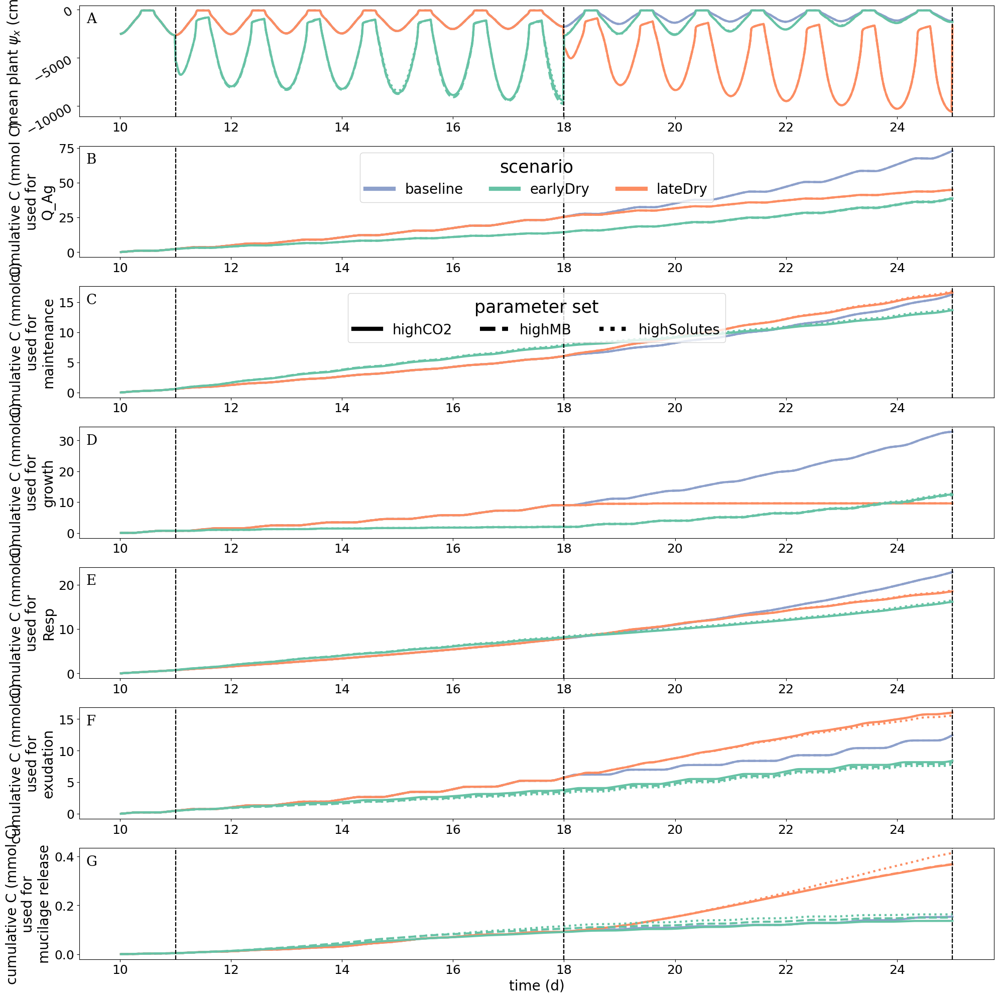

In [26]:

dotheplot(toplot =  ['psiXyl',"Q_Ag","Q_Rm",'Q_Gr','Resp','Q_Exud','Q_Mucil'],#'Q_Exud_mean',
          namesyaxes={'psiXyl':"mean plant $\psi_x$", 'Resp':'Resp',
                      'Q_Gr':"growth", "Q_Rm":"maintenance","Q_Ag":"Q_Ag",
                      'Q_Exud':"exudation",'Q_Exud_mean':"exudation rate\n at root tip",
                      'Q_Mucil': "mucilage release"},
          cumsum=True, df=dftemp, sizerows=20,sizecols_=20,ncols=1, 
          indexlegend1=1, indexlegend2=2)
#plt.savefig('Cusage.png')

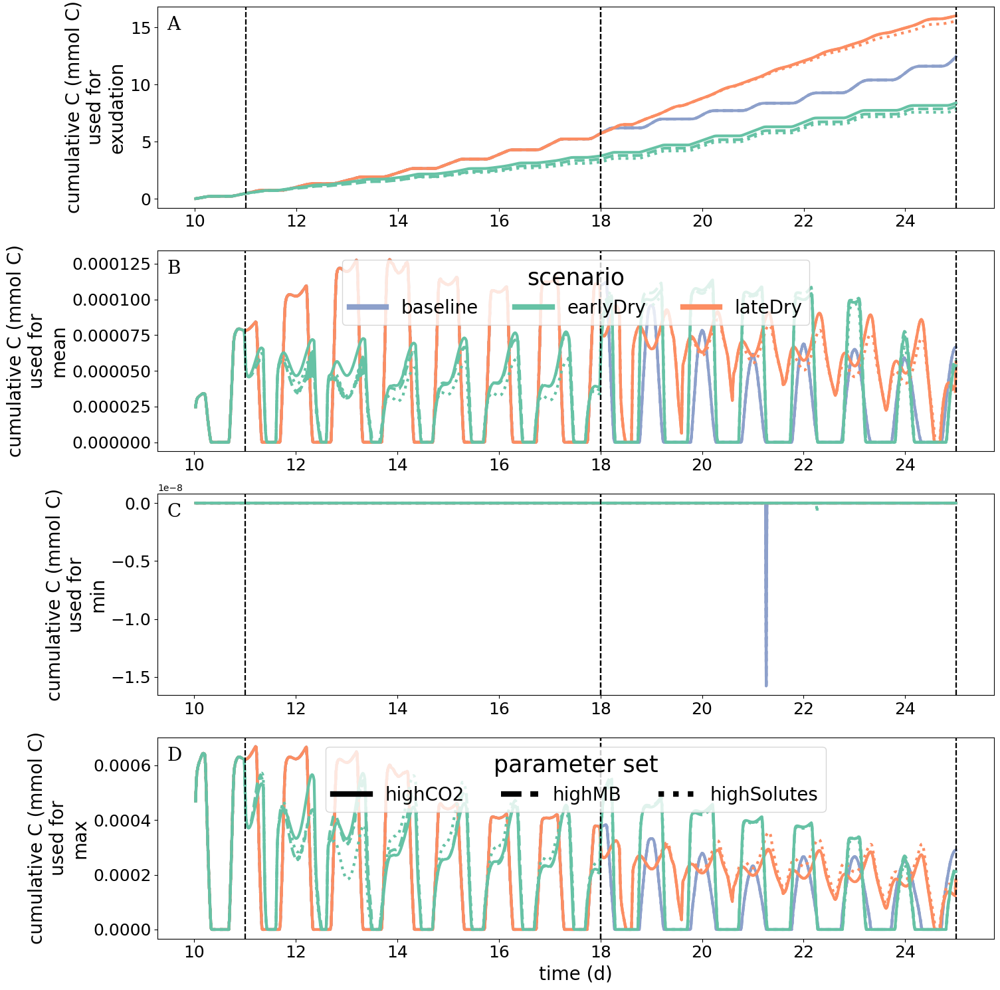

In [8]:

dotheplot(toplot =  ['Q_Exud','Q_Exud_mean','Q_Exud_min','Q_Exud_max'],
          namesyaxes={'psiXyl':"$\psi_x$", 'Q_Gr':"growth", 'Q_Exud':"exudation", 'Q_Exud_mean':"mean",'Q_Exud_min':"min",'Q_Exud_max':"max",
                      'Q_Mucil': "mucilage"},
          cumsum=True, df=dftemp, sizerows=15,sizecols_=15,ncols=1, indexlegend1=1, indexlegend2=3)

In [118]:
import string 
def bin_(dataframe, independent_variable, dependent_variable):
    
    
    grouped = dataframe.groupby(dataframe[independent_variable].round())

    # Step 3: Compute the sum of dependent variable for each bin and the mean of the independent variable
    bin_meansZ = grouped[independent_variable].mean()
    bin_sumX = (grouped[dependent_variable]).sum()#/(grouped[vol]).sum()
    #bin_minX = (grouped[dependent_variable]).max()
    #bin_maxX = (grouped[dependent_variable]).min()
    df = dataframe.sort_values(by=independent_variable, ascending=False)
    df['cum'+dependent_variable] = df[dependent_variable].cumsum()
    return bin_meansZ.to_numpy(), bin_sumX.to_numpy()# df[independent_variable].dropna(), df['cum'+dependent_variable].dropna()

In [119]:
bin_meansZ, bin_sumX_ = bin_(GiniAll[0], 'meanZ', 'segL')

In [120]:
bin_meansZ

array([-25.07511314, -24.20051825, -23.08700362, -22.12461242,
       -21.07684073, -20.09887638, -19.07760302, -17.99084664,
       -17.05812662, -16.08743916, -15.05433562, -13.97201626,
       -12.9741638 , -11.92670053, -10.95652899,  -9.98065179,
        -8.91237334,  -7.96352603,  -6.98905484,  -6.03485623,
        -5.08161984,  -4.06101178,  -3.04430223,  -2.03940655,
        -0.87681581])

In [66]:
len(set(GiniAll[0]['meanZ']))

1121

In [48]:
GiniAll[0].columns


Index(['Pset', 'scenario', 'meanZ', 'segL'], dtype='object')

In [156]:


def bin_and_plot(dataframe, independent_variable, dependent_variable,                 
                 nrows, ncols, indexsubplot,age = 25,idplotlegend1=1,
                 idplotlegend2=2,anchor1=(0.8,0.5), 
                  sizeplot=(15,15),pad_=1.08,
                 anchor2=(0.8, 0.2),offsetsubplotname=0,# sameXlimPercolumns=False,
                 unit=None, doLogX=False,xlim = None, ylim = None,title = None,unitChange=1,
                 doLogY=False, colVar = None, xlabels=None, axs=None,
                 dominmax = True, fig=None, loc_=None, rect_=[0, 0.0, 1, 1]):
    
    if indexsubplot==1:
        fig, axs = plt.subplots(nrows, ncols, figsize=sizeplot)  # Adjust the figure size as needed
    if nrows * ncols > 1:
        ax = axs.flat[indexsubplot-1]
    else:
        ax = axs

    
    l_styles = {'5':'-','44':'--','61':':'}
    # Define the color dictionary
    c_styles = {
    'baseline':'#8da0cb',  # Blue
    'earlyDry':  '#66c2a5' ,  # Green
    'lateDry': '#fc8d62'  # red
    }#

    for df_ in dataframe:
        
        if len(df_) > 0:
            #df_[independent_variable], df_[dependent_variable] #
            bin_meansZ, bin_sumX_ = bin_(df_, independent_variable, dependent_variable)
            if False:
                bin_sumX_ /= bin_sumX_.max()
                # .values
            volume = sum(bin_sumX_)#6 * 12 *1
            ax.plot( bin_sumX_*unitChange/volume, bin_meansZ,
                                                             linewidth=3,
                         #label=f'{i}',
                         c=c_styles[df_['scenario'].unique()[0]],
                         linestyle=l_styles[df_['pSet'].unique()[0]]
                        )
            if False:#dominmax:
                ax.fill_betweenx(bin_meansZ,
                              bin_minX*unitChange, bin_maxX*unitChange ,
                             alpha=0.1,color=c_styles[df_['scenario'].unique()[0]])
                
    # Color legend
    color_legend_elements = [
        Line2D([0], [0], color=c_styles['baseline'], lw=5, label='baseline'),
        Line2D([0], [0], color=c_styles['earlyDry'], lw=5, label='earlyDry'),
        Line2D([0], [0], color=c_styles['lateDry'], lw=5, label='lateDry')
    ]

    # Line style legend
    linestyle_legend_elements = [
    Line2D([0], [0], color='black', linestyle=l_styles['5'], lw=6, label="highCO2"),
    #Line2D([0], [0], color='black', linestyle=l_styles[38], lw=6, label=38),
    Line2D([0], [0], color='black', linestyle=l_styles['44'], lw=6, label="highMB"),
    Line2D([0], [0], color='black', linestyle=l_styles['61'], lw=6, label="lowMUptake")
    ]


    if unit is None:
        unit = ''#'mol/cm3'
    #if (indexsubplot%ncols) ==1:
    ax.set_ylabel('depth (cm)', fontsize=20) #
    
    # Set tick label font size
    ax.tick_params(axis='both', which='major', labelsize=18)
    #ax.tick_params(axis='x', which='major', labelrotation=30, labelsize=18)

    if xlabels is None:
        if dependent_variable == '$CO_2$':
            ax.set_xlabel('Produced ' + dependent_variable+' ('+unit+')', fontsize=20)
        else:
            ax.set_xlabel('Normalised root length density (-)', fontsize=20)# dependent_variable+' ('+unit+')', fontsize=20)
    else:
        
        if dependent_variable == 'co2':
            ax.set_xlabel('Produced ' + xlabels[dependent_variable] +' ('+unit+')', fontsize=20)
        else:
            ax.set_xlabel( xlabels[dependent_variable] +' ('+unit+')', fontsize=20)

    #if ylim is not None:
    ax.set_ylim(None,0)

    if False:
        # Set x-axis to scientific format
        formatter = ScalarFormatter(useMathText=True)
        formatter.set_powerlimits((-2, 2))
        ax.xaxis.set_major_formatter(formatter)
        ax.ticklabel_format(style='scientific', axis='x', scilimits=(0,0))
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2e}'))


    # Get the corresponding letter label
    if False:
        label = string.ascii_uppercase[offsetsubplotname+indexsubplot-1]
        ax.annotate(
                label,
                xy=(0, 1.12), xycoords='axes fraction',
                xytext=(+0.5, -0.5), textcoords='offset fontsize',
                fontsize='20', verticalalignment='top', fontfamily='serif',
                bbox=dict(facecolor='1.', edgecolor='none', pad=3.0))
    
    #plt.gca().yaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
    #plt.gca().set_xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
    if doLogY:
        ax.set_yscale('log')
    if doLogX:
        ax.set_xscale('log')
    # idplotlegend2
    if (idplotlegend1 is not None) :
        if (indexsubplot == idplotlegend1):
            if loc_ is None:
                color_legend = ax.legend(handles=color_legend_elements, 
                           fontsize=20, title='scenario', title_fontsize='25', framealpha=1,
                           loc='lower center',# bbox_to_anchor=(0.7, 0.7), 
                           ncol=1)
                ax.add_artist(color_legend)
                

                linestyle_legend = ax.legend(handles=linestyle_legend_elements, 
                           fontsize=20, title='parameter set', title_fontsize='25', framealpha=1,
                           loc='lower right', #bbox_to_anchor=(0.6, 0.3), 
                           ncol=1)
                ax.add_artist(linestyle_legend)

            else:
                color_legend = fig.legend(handles=color_legend_elements, 
                           fontsize=20, title='scenario', title_fontsize='25', framealpha=1,
                           loc=loc_, bbox_to_anchor=anchor1, 
                           ncol=1)                
                fig.add_artist(color_legend)

                

                linestyle_legend = fig.legend(handles=linestyle_legend_elements, 
                           fontsize=20, title='parameter set', title_fontsize='25', framealpha=1,
                           loc='lower right', #bbox_to_anchor=(0.6, 0.3), 
                           ncol=1)
                fig.add_artist(linestyle_legend)

    elif indexsubplot == nrows*ncols:
        fig.legend(handles=color_legend_elements, 
                   fontsize=20, title='scenario', title_fontsize='25', framealpha=1,
                   loc='upper center',bbox_to_anchor=(0.5, 0), 
                   ncol=1)
    if (idplotlegend2 is not None) :
        if (indexsubplot == idplotlegend2) and (loc_ is None):
            linestyle_legend = ax.legend(handles=linestyle_legend_elements, 
                       fontsize=20, title='parameter set', title_fontsize='25', framealpha=1,
                       loc='upper left', #bbox_to_anchor=(0.6, 0.3), 
                       ncol=1)
            ax.add_artist(linestyle_legend)
    elif indexsubplot == nrows*ncols:
        if loc_ is None:
            fig.legend(handles=linestyle_legend_elements, 
                       fontsize=20, title='parameter set', title_fontsize='25', framealpha=1,
                       loc='center', bbox_to_anchor=(0.5, -0.07), 
                       ncol=3)
        else:
            plt.legend(handles=linestyle_legend_elements, 
                       fontsize=20, title='parameter set', title_fontsize='25', framealpha=1,
                       loc=loc_, bbox_to_anchor=anchor1,#(0.5, -0.07), 
                       ncol=3)
    #if indexsubplot%2==0:
    #if (indexsubplot%ncols) !=1:
    #    ax.yaxis.set_tick_params(labelleft=False)
    ax.grid(True)

    # Extract current y-tick labels
    yticks = ax.get_yticks()
    ytick_labels = [f'{int(abs(t))}' for t in yticks]

    # Set the modified labels back, keeping the original order
    ax.set_yticks(yticks)
    ax.set_yticklabels(ytick_labels)

    plt.tight_layout()#rect=rect_,pad=pad_) #  (left, bottom, right, top), default: (0, 0, 1, 1)
    return fig, axs


In [79]:
# 'nodes_Z','segments_nodeX',

scenarios = [ "baseline", "lateDry","earlyDry"]
setIds =['5','44','61']
dataInputs =  [(scenario, str(setId)) for scenario in scenarios 
              for setId in setIds if (scenario, str(setId)) 
              not in exceptPset ]
GiniAll = []
for ii,dataInput in enumerate(dataInputs):
    GiniAll_ = pd.DataFrame(columns=['Pset','scenario','meanZ','segL'])
    scenario = dataInput[0]
    setId = dataInput[1]
    path2file = path2file_.format(scenario, setId)
    print(path2file)
    otsegs = get_last_line_as_numpy_array(path2file +'organTypes.txt' ,  dtype = int, verbose = False)
    nodes_Z = get_last_line_as_numpy_array(path2file +'nodes_Z.txt' ,  dtype = float, verbose = False)#[otsegs == 2]
    segL = get_last_line_as_numpy_array(path2file +'length_Segs.txt' ,  dtype = float, verbose = False)[otsegs == 2]
    segments_nodeX = get_last_line_as_numpy_array(path2file +'segments_nodeX.txt' ,  dtype = int, verbose = False)[otsegs == 2]
    segments_nodeY = np.array([ids+1 for ids in range(len(otsegs))])[otsegs == 2]
    meanZ = (nodes_Z[segments_nodeX] + nodes_Z[segments_nodeY])/2
    segL = segL[meanZ < 0]
    meanZ = meanZ[meanZ<0]
    GiniAll_['segL'] = segL
    GiniAll_['meanZ'] = (nodes_Z[segments_nodeX] + nodes_Z[segments_nodeY])/2
    GiniAll_['pSet'] = setId
    GiniAll_['scenario'] = scenario
    GiniAll.append(GiniAll_)
    
#GiniAll = pd.concat(GiniAll, ignore_index=True)

TraiRhizo/paperSc/NewSetup/baseline_1440_5_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/baseline_1440_44_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/baseline_1440_61_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/lateDry_1440_5_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/lateDry_1440_44_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/lateDry_1440_61_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/earlyDry_1440_5_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/earlyDry_1440_44_10to25_20mn_0s_32/
TraiRhizo/paperSc/NewSetup/earlyDry_1440_61_10to25_20mn_0s_32/


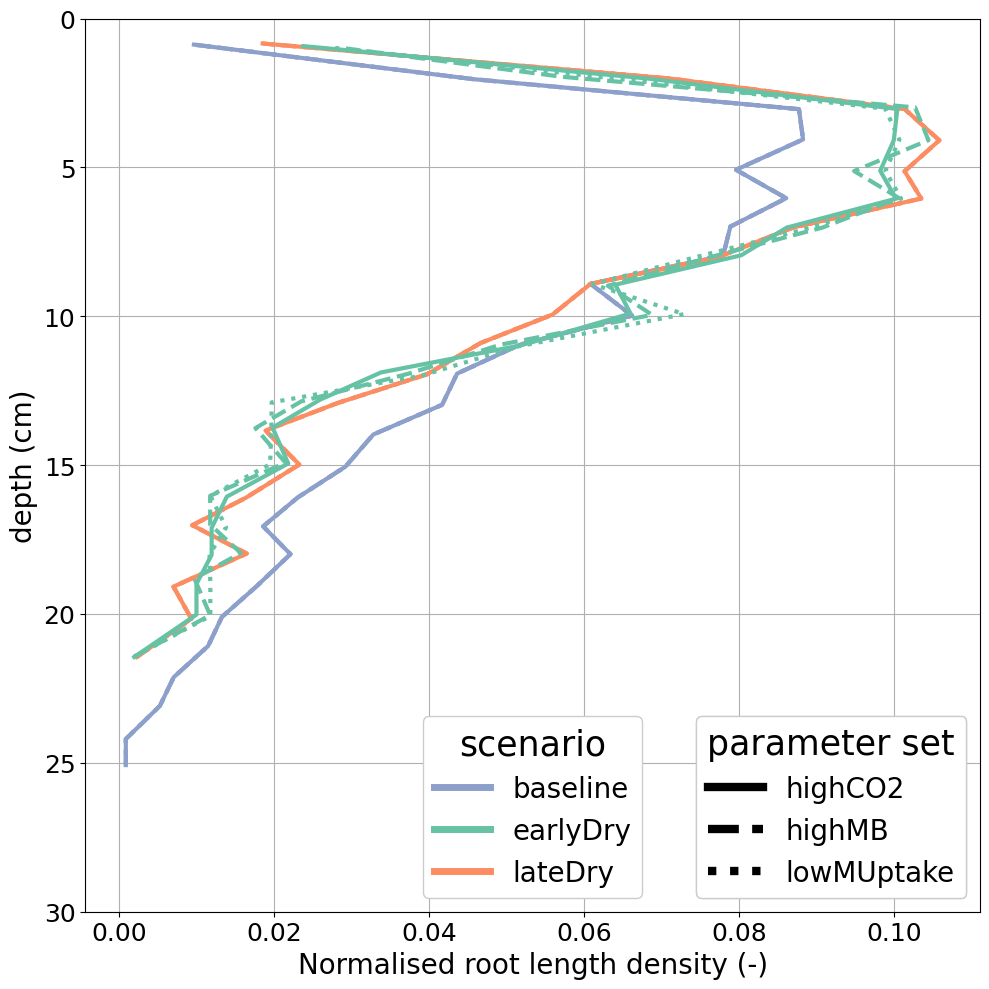

In [157]:

bin_and_plot(GiniAll, 'meanZ', 'segL',             
                 1,1,indexsubplot=1,    sizeplot=(10,10))
plt.savefig('NRLD.png')

In [96]:
GiniAll[0]['meanZ'].round()#.min()

0       -1.0
1       -2.0
2       -3.0
3       -4.0
4       -4.0
        ... 
1116   -18.0
1117   -22.0
1118    -4.0
1119    -3.0
1120    -4.0
Name: meanZ, Length: 1121, dtype: float64

In [ ]:
GiniAll[0]['meanZ'].round()

In [20]:
dftemp[3]['Q_Exud_min'][:2]

0    NaN
1    0.0
Name: Q_Exud_min, dtype: float64

In [14]:
dftemp[3][dftemp[3]['Q_Exud_max']==np.nanmax(dftemp[3]['Q_Exud_max'])]['Q_Exud_tot']

86    0.00066
Name: Q_Exud_tot, dtype: float64

In [17]:
dftemp[3][dftemp[3]['Q_Exud_max']==np.nanmax(dftemp[3]['Q_Exud_max'])]['Q_Exud']

86    0.000674
Name: Q_Exud, dtype: float64

In [12]:
np.nanmax(dftemp[3]['Q_Exud_max'])

6.676530112032797e-07

In [ ]:
# dotheplot(toplot =  ['Q_Ag','Q_Rm','Q_Exud_mean','Q_Exud', 'Q_Mucil'],
#          cumsum=False, df=dftemp, sizerows=30,sizecols_=15)

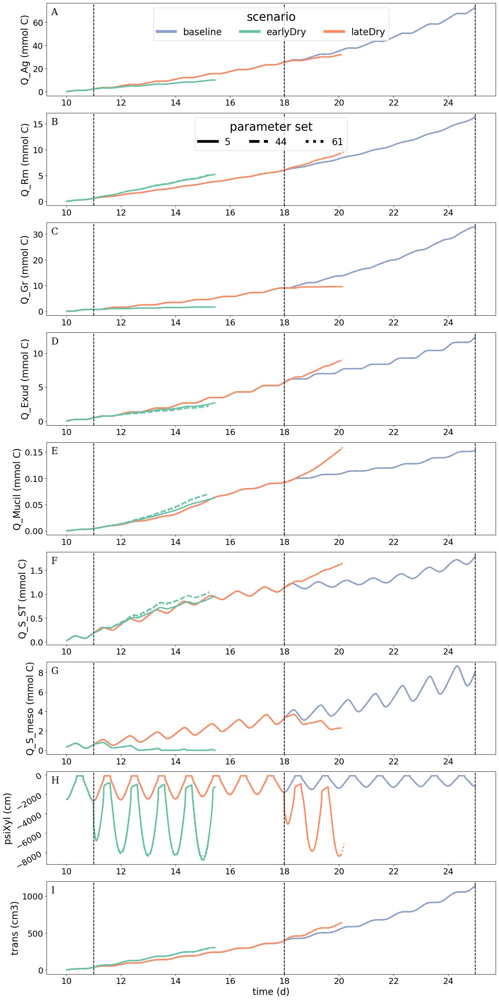

In [168]:

dotheplot(toplot =  ['Q_Ag','Q_Rm','Q_Gr', 'Q_Exud','Q_Mucil', #(toplot, cumsum,df, sizerows,sizecols,ncols=3, maxTime = None):
                     'Q_S_ST', 'Q_S_meso','psiXyl', 'trans'],
          cumsum=True, df=dftemp, sizerows=15,sizecols_=30,ncols=1)

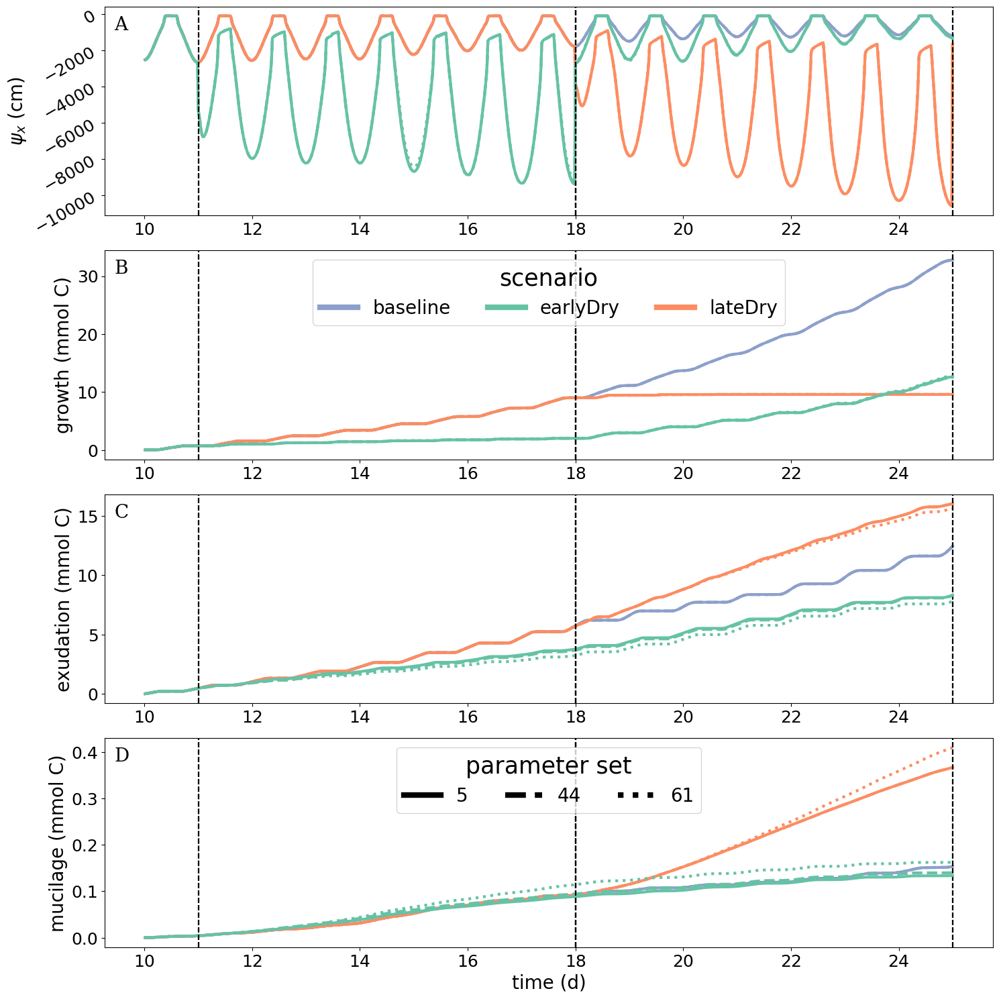

In [140]:
dotheplot(toplot =  ['psiXyl','Q_Gr','Q_Exud','Q_Mucil'],
          namesyaxes={'psiXyl':"$\psi_x$", 'Q_Gr':"growth", 'Q_Exud':"exudation",'Q_Mucil': "mucilage"},
          cumsum=True, df=dftemp, sizerows=15,sizecols_=15,ncols=1, indexlegend1=1, indexlegend2=3)
plt.savefig('Cusage.png')

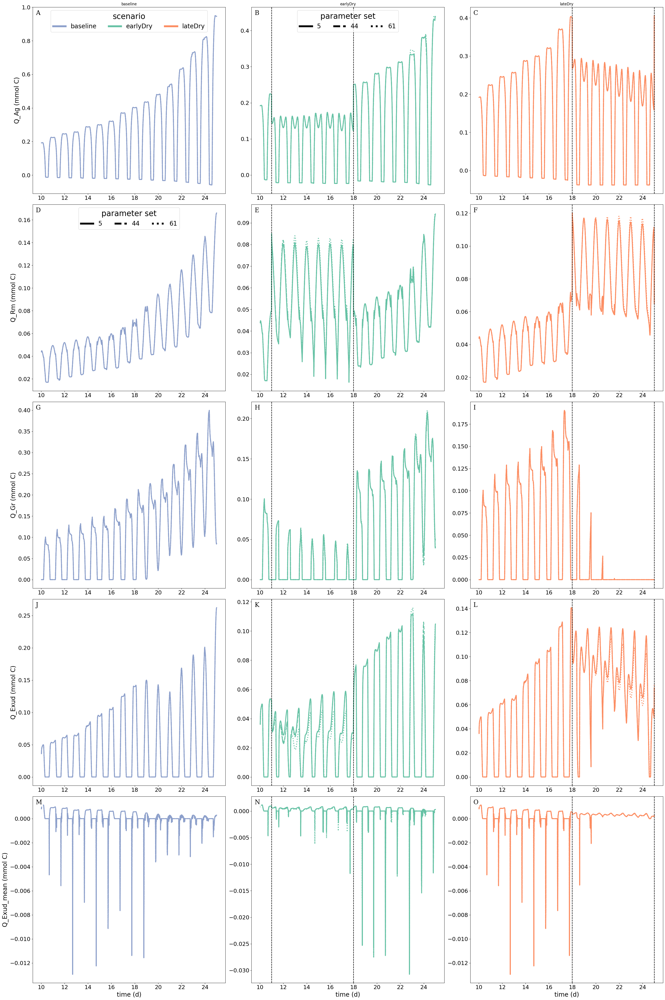

In [156]:

dotheplot(toplot =  ['Q_Ag','Q_Rm','Q_Gr','Q_Exud', 'Q_Exud_mean'],
          cumsum=False, df=dftemp, sizerows=30,sizecols_=15)

In [109]:
df44late=dftemp[4].copy()
df44early=dftemp[7].copy()
df44late = df44late[(df44late['time'] >= 18 )&(df44late['time'] <=25)].reset_index(drop=True)
df44early = df44early[(df44early['time'] >= 11. )&(df44early['time'] <=18)].reset_index(drop=True)
df44late['time']= np.round(df44late['time']-18,6) 
df44early['time']= np.round(df44early['time'] - 11,6) 

In [110]:
df44earlylate = pd.merge(df44late,df44early, on="time")

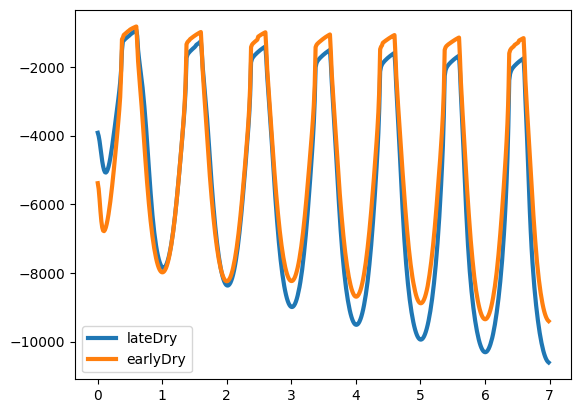

In [111]:
plt.plot( df44earlylate['time'], df44earlylate['psiXyl_x'],linewidth=3,
                         label=f"{df44earlylate['scenario_x'].unique()[0]}",
                    )
plt.plot( df44earlylate['time'], df44earlylate['psiXyl_y'],linewidth=3,
                         label=f"{df44earlylate['scenario_y'].unique()[0]}",
                    )
plt.legend()

In [69]:
df44early

,Q_Ag,Q_Rm,Q_Gr,Q_Exud_tot,Q_Mucil_tot,Q_Exud,Q_Mucil,Q_S_ST,Q_S_meso,trans,psiXyl,time,pSet,scenario
71,0.002292,0.000609,0.000694,0.000457,0.000004,0.000468,0.000004,0.000190,0.000595,0.659706,-5386.519053,2.842171e-14,44,earlyDry
72,0.002328,0.000629,0.000694,0.000468,0.000004,0.000477,0.000004,0.000194,0.000613,0.695812,-5550.980872,1.388889e-02,44,earlyDry
73,0.002364,0.000649,0.000694,0.000477,0.000004,0.000485,0.000004,0.000197,0.000627,0.730556,-5852.412940,2.777778e-02,44,earlyDry
74,0.002400,0.000669,0.000694,0.000485,0.000004,0.000493,0.000004,0.000201,0.000640,0.763527,-6203.777314,4.166667e-02,44,earlyDry
75,0.002436,0.000689,0.000694,0.000493,0.000004,0.000501,0.000004,0.000204,0.000650,0.794745,-6494.917612,5.555556e-02,44,earlyDry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,0.014254,0.007774,0.002009,0.003384,0.000107,0.003392,0.000107,0.001333,0.000000,7.887086,-9121.760411,6.930556e+00,44,earlyDry
571,0.014285,0.007794,0.002009,0.003392,0.000107,0.003399,0.000107,0.001335,0.000000,7.908231,-9196.376070,6.944444e+00,44,earlyDry
572,0.014317,0.007814,0.002009,0.003399,0.000107,0.003407,0.000107,0.001337,0.000000,7.929337,-9254.173773,6.958333e+00,44,earlyDry
573,0.014348,0.007834,0.002009,0.003407,0.000107,0.003414,0.000107,0.001339,0.000000,7.950388,-9296.037919,6.972222e+00,44,earlyDry


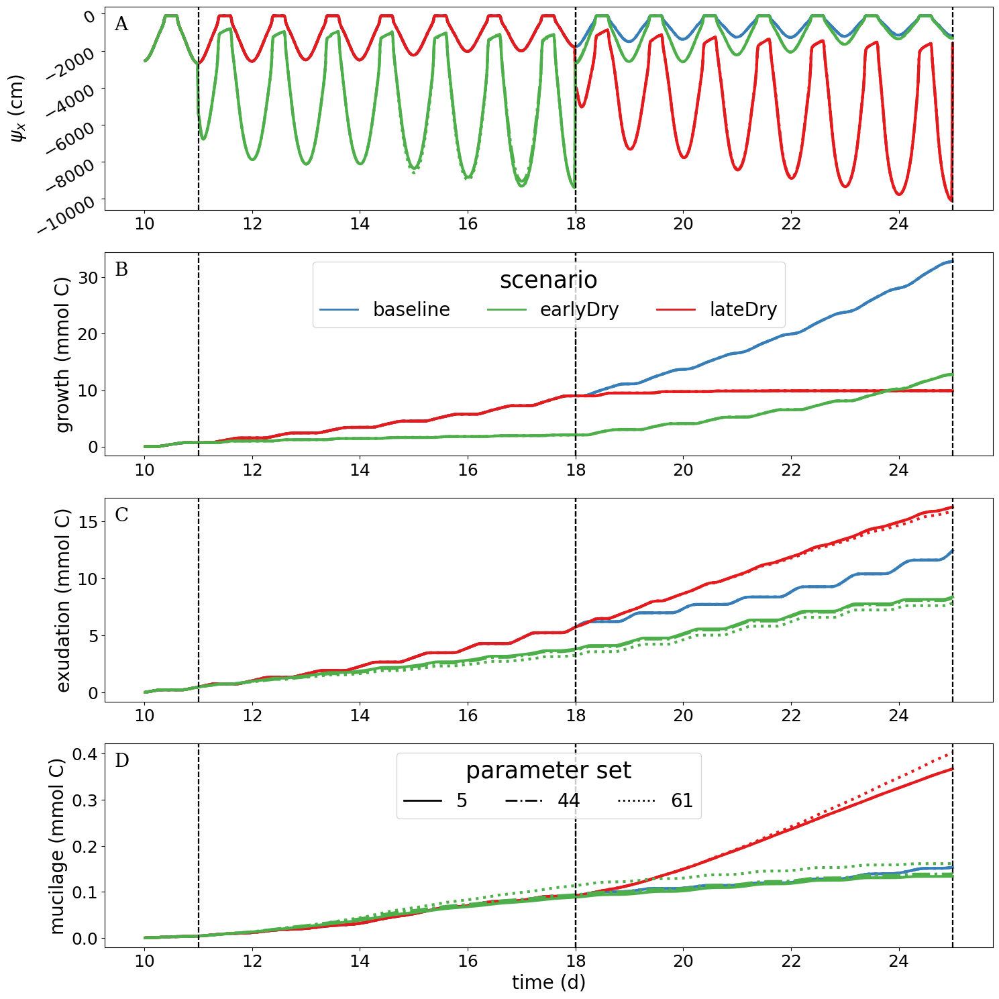

In [30]:

dotheplot(toplot =  ['psiXyl','Q_Gr','Q_Exud','Q_Mucil'],
          namesyaxes={'psiXyl':"$\psi_x$", 'Q_Gr':"growth", 'Q_Exud':"exudation",'Q_Mucil': "mucilage"},
          cumsum=True, df=dftemp, sizerows=15,sizecols_=15,ncols=1, indexlegend1=1, indexlegend2=3)

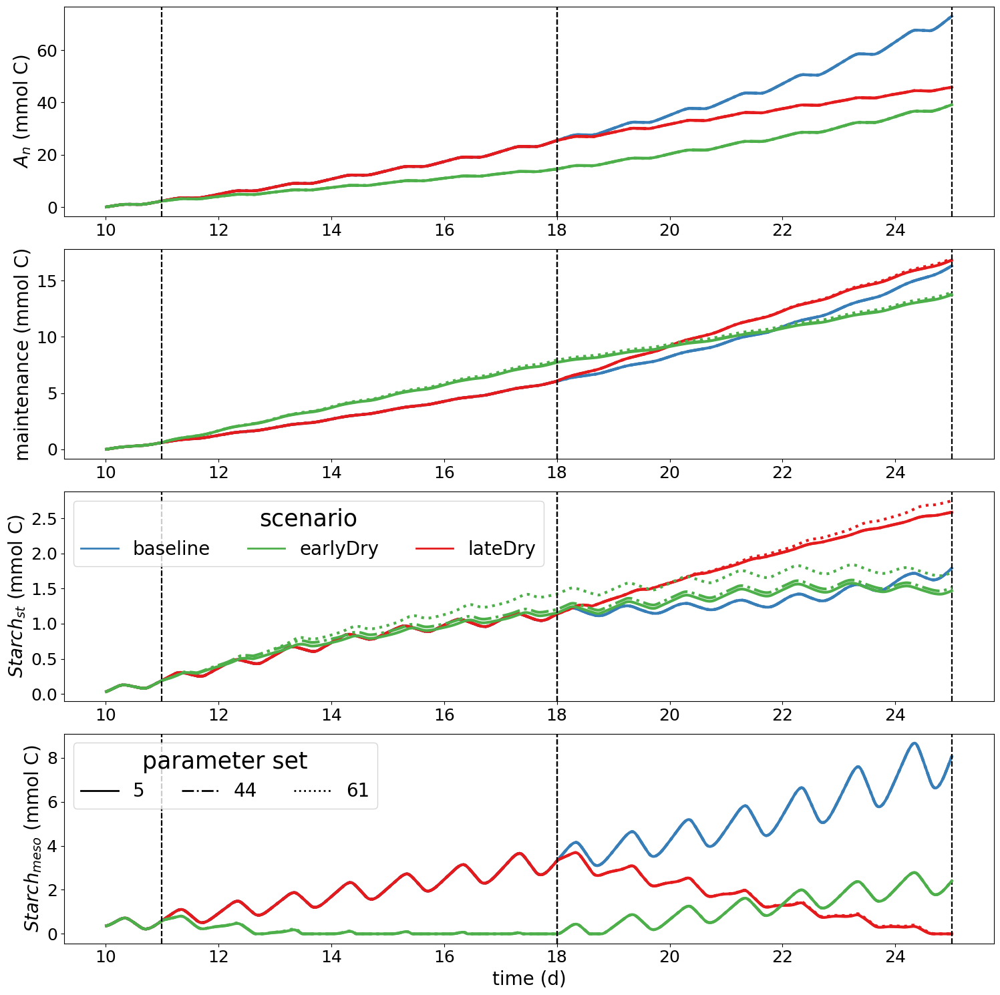

In [76]:

dotheplot(toplot =  ['Q_Ag','Q_Rm','Q_S_ST', 'Q_S_meso'],
          namesyaxes={'Q_Ag':"$A_n$", 'Q_Rm':"maintenance", 'Q_S_ST':"$Starch_{st}$",'Q_S_meso': "$Starch_{meso}$"},
          cumsum=True, df=dftemp, sizerows=15,sizecols_=15,ncols=1, indexlegend1=2, indexlegend2=3)

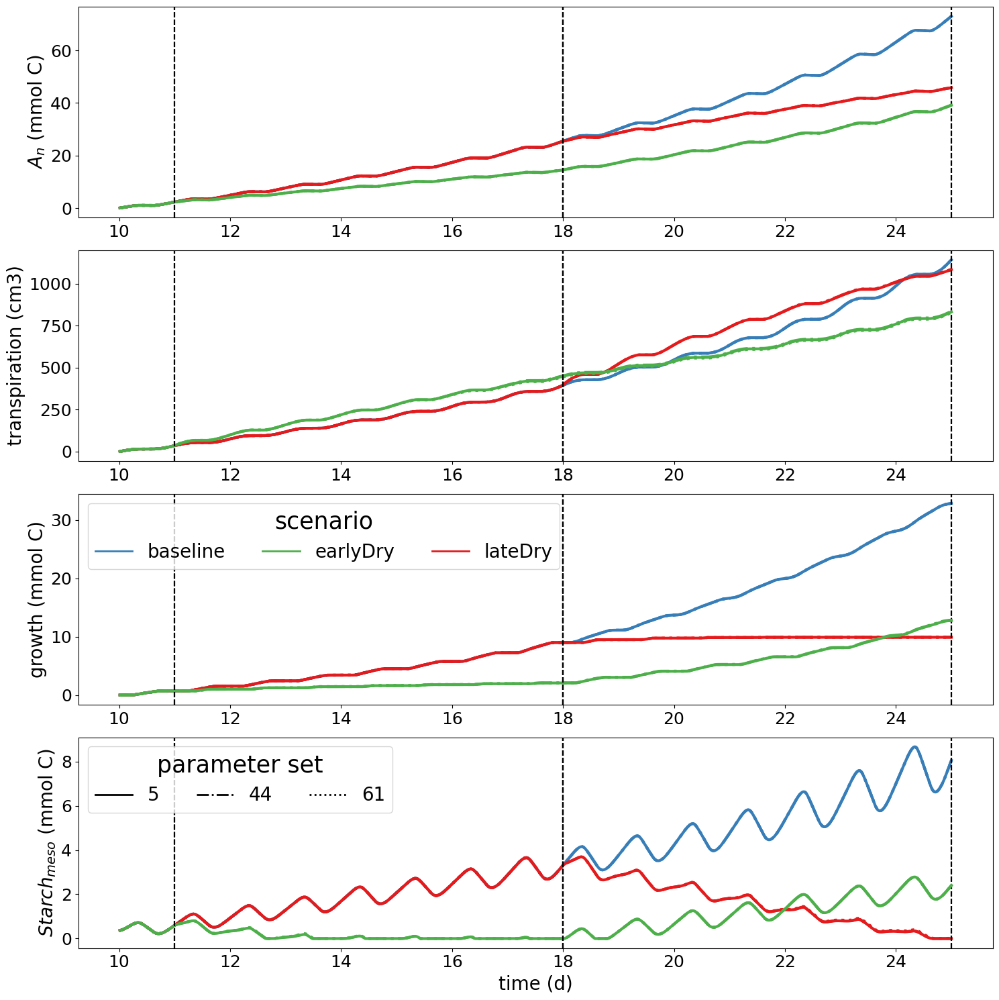

In [78]:

dotheplot(toplot =  ['Q_Ag','trans','Q_Gr', 'Q_S_meso'],
          namesyaxes={'Q_Ag':"$A_n$", 'trans':"transpiration", 'Q_Gr':"growth", 'Q_S_meso': "$Starch_{meso}$"},
          cumsum=True, df=dftemp, sizerows=15,sizecols_=15,ncols=1, indexlegend1=2, indexlegend2=3)

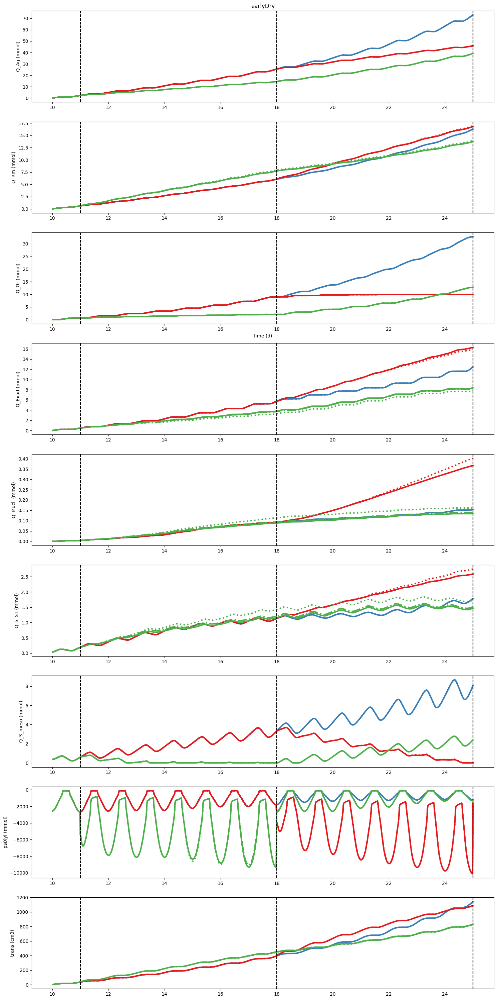

In [37]:

dotheplot(toplot =  ['Q_Ag','Q_Rm','Q_Gr', 'Q_Exud','Q_Mucil', #(toplot, cumsum,df, sizerows,sizecols,ncols=3, maxTime = None):
                     'Q_S_ST', 'Q_S_meso','psiXyl', 'trans'],
          cumsum=True, df=dftemp, sizerows=15,sizecols_=30,ncols=1)

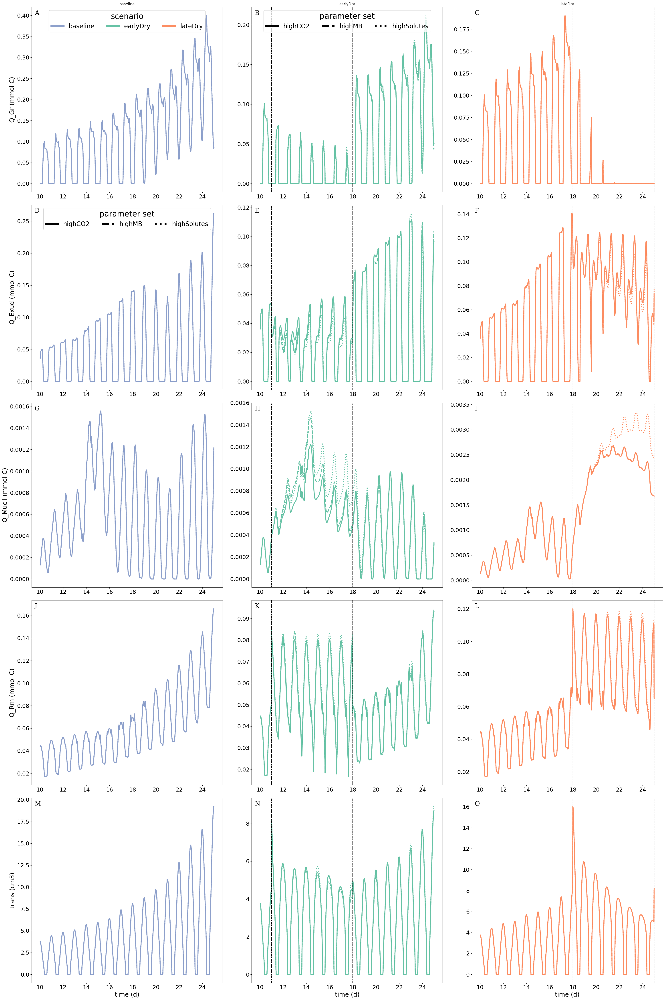

In [27]:

dotheplot(toplot =  ['Q_Gr','Q_Exud','Q_Mucil','Q_Rm', 'trans'],
          cumsum=False, df=dftemp, sizerows=30,sizecols_=15)